# PART 1: EDA (With Data Preprocessing)

## REFER TO PART 2: [`modelling.ipynb`](./modelling.ipynb) for ML Findings

## **Introduction**

### **Research objectives**

The main objective of this research is to develop 3 Machine Learning Models which are able to predict those with diabetes (gh >= 6.5%) with the best predictability rate. The end-user of this ML system will be the medical professionals and potentially the patients who would like to know whether they could be having diabetes. By accurately predicting diabetes, this predictive models will help to ensure prompt intervention on patients with diabetes, thus ensuring better life outcomes for the patients and avert uncecessary further financial burden due to delayed treatment.

### **Machine Learning Task and proposed models**

I will first need to create a target variable `has_diabetes` (tells us whether the patient is diabetic or not according to specified gh percentage), I will thus be adopting a supervised learning approach, since labels are already present, with a 70-30 train test split. To better explain the decision-making process behind each models (whether easily interpretable or not), I will also adopt the use of an Explainable-AI tool, which in my case is the SHAP, which stands for SHapley Additive exPlanations, which is to provide interpretable insights on how each of the feature impacts the model's decision making process. The benefit of such is that it can also educate the end-users on some of the key reasons and trends of identifying diabetes based on the unique attributes of patients. At the same time, it provides a human-over-the-loop monitoring for the team of data scientists/engineers to verify the decision-making process of the ML models, to ensure the ethics of AI and transparency of AI are upheld, especially important for the health sector. This is important to avert any biases in the model prediction.

### **Exploratory Data Analysis**

This flow aims to first deepen our understanding of the characteristics behind the dataset, which can facilitate proper data preparation processes such as feature removal, feature selection, feature engineering, and the conduct of statistical tests (hypothesis testing and correlation tests).

Along the way in this notebook, the main aim is to:

- Perform Data Quality Check: Examining the dataset for missing values, extreme/unusual values and class
- Provide Descriptive Statistics and Analysis: This is important to guide the modelling process and highlight/corroborate the importance of each ML models in the subsequent part

The EDA Process will therefore comprise the following steps below:

1. Data Collection and Understanding
2. Data Cleaning and Preprocessing
3. Descriptive Statistics
4. Univariate Analysis
5. Bivariate Analysis
6. Multivariate Analysis
7. Feature Engineering
8. Report EDA Findings and Visualisations

Generally, the aim at the end of EDA process is to uncover key insights that will guide the modeling process and highlight the importance of each of the three ML models

Along the way in this notebook, we will also uncover some additional insights which will also aid us in the understanding of our data and how we frame our ML solutions to fulfill our research objectives.


In [60]:
# Load relevant libraries

import pandas as pd
import sys
import os
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


import plotly.express as px
import plotly.graph_objects as go
import dash
from dash import dcc, html
from dash.dependencies import Input, Output
from dash_table import DataTable, FormatTemplate


from datetime import datetime, date
from IPython.display import display

from sklearn import datasets, linear_model, preprocessing
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import GradientBoostingClassifier, StackingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report

from ydata_profiling import ProfileReport
from scipy.stats import chi2_contingency
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
from sklearn.preprocessing import LabelEncoder

import shap

#### **Data Collection and Understanding**


In [61]:
# Data Preparation

# Load the dataset
raw_df = pd.read_csv("nhgh.tsv", sep="\t")


# Display basic information about the dataset
display(raw_df.info())
display(raw_df.head())
# Check for duplicated rows
display(f"There are {raw_df.duplicated().sum()} duplicated rows")
display(raw_df.describe(include="all"))

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6795 entries, 0 to 6794
Data columns (total 20 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   seqn     6795 non-null   int64  
 1   sex      6795 non-null   object 
 2   age      6795 non-null   float64
 3   re       6795 non-null   object 
 4   income   6475 non-null   object 
 5   tx       6795 non-null   int64  
 6   dx       6795 non-null   int64  
 7   wt       6795 non-null   float64
 8   ht       6795 non-null   float64
 9   bmi      6795 non-null   float64
 10  leg      6564 non-null   float64
 11  arml     6616 non-null   float64
 12  armc     6607 non-null   float64
 13  waist    6556 non-null   float64
 14  tri      6314 non-null   float64
 15  sub      5824 non-null   float64
 16  gh       6795 non-null   float64
 17  albumin  6706 non-null   float64
 18  bun      6706 non-null   float64
 19  SCr      6706 non-null   float64
dtypes: float64(14), int64(3), object(3)
memory usage: 1.

None

,seqn,sex,age,re,income,tx,dx,wt,ht,bmi,leg,arml,armc,waist,tri,sub,gh,albumin,bun,SCr
0,51624,male,34.166667,Non-Hispanic White,"[25000,35000)",0,0,87.4,164.7,32.22,41.5,40.0,36.4,100.4,16.4,24.9,5.2,4.8,6.0,0.94
1,51626,male,16.833333,Non-Hispanic Black,"[45000,55000)",0,0,72.3,181.3,22.00,42.0,39.5,26.6,74.7,10.2,10.5,5.7,4.6,9.0,0.89
2,51628,female,60.166667,Non-Hispanic Black,"[10000,15000)",1,1,116.8,166.0,42.39,35.3,39.0,42.2,118.2,29.6,35.6,6.0,3.9,10.0,1.11
3,51629,male,26.083333,Mexican American,"[25000,35000)",0,0,97.6,173.0,32.61,41.7,38.7,37.0,103.7,19.0,23.2,5.1,4.2,8.0,0.80
4,51630,female,49.666667,Non-Hispanic White,"[35000,45000)",0,0,86.7,168.4,30.57,37.5,36.1,33.3,107.8,30.3,28.0,5.3,4.3,13.0,0.79


'There are 0 duplicated rows'

,seqn,sex,age,re,income,tx,dx,wt,ht,bmi,leg,arml,armc,waist,tri,sub,gh,albumin,bun,SCr
count,6795.000000,6795,6795.000000,6795,6475,6795.000000,6795.000000,6795.000000,6795.000000,6795.000000,6564.000000,6616.000000,6607.000000,6556.000000,6314.000000,5824.000000,6795.000000,6706.000000,6706.000000,6706.000000
unique,NaN,2,NaN,5,14,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,female,NaN,Non-Hispanic White,>= 100000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,3423,NaN,3117,877,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,56872.080500,NaN,44.285700,NaN,NaN,0.091832,0.134511,79.370625,167.042958,28.321741,38.409324,36.874607,32.485152,96.254149,18.787726,19.961556,5.676586,4.273621,12.917686,0.878627
std,3043.535776,NaN,20.594593,NaN,NaN,0.288810,0.341225,21.930903,10.264984,6.950110,3.876902,2.781616,5.297660,17.059193,8.319393,8.369083,0.964700,0.326545,5.717571,0.445238
min,51624.000000,NaN,12.000000,NaN,NaN,0.000000,0.000000,28.000000,123.300000,13.180000,20.400000,24.800000,16.800000,52.000000,2.600000,3.800000,4.000000,2.500000,1.000000,0.140000
25%,54245.500000,NaN,25.666667,NaN,NaN,0.000000,0.000000,64.000000,159.600000,23.430000,36.000000,35.000000,28.850000,83.500000,12.000000,13.000000,5.200000,4.100000,9.000000,0.700000
50%,56873.000000,NaN,43.750000,NaN,NaN,0.000000,0.000000,76.300000,166.600000,27.290000,38.400000,36.800000,32.100000,95.300000,17.900000,19.400000,5.500000,4.300000,12.000000,0.830000
75%,59510.500000,NaN,61.333333,NaN,NaN,0.000000,0.000000,91.100000,174.500000,31.880000,41.000000,38.800000,35.600000,106.900000,25.000000,26.200000,5.800000,4.500000,15.000000,0.980000


**At once glance, we know that `seqn` will not have much relationship or association with the outcome of diabetes, as its purely for identification, hence we will drop this column on the fly**


In [62]:
raw_df.drop("seqn", axis=1, inplace=True)

**We also create a new label since this is going to be a supervised learning ML project**


In [63]:
raw_df["has_diabetes"] = raw_df["gh"].apply(lambda x: x >= 6.5).map({True: 1, False: 0})

In [64]:
# Sanity check to see if target variable is correctly corresponding to gh level
raw_df[raw_df["has_diabetes"] == 1].gh.describe()

count    628.000000
mean       7.959873
std        1.679508
min        6.500000
25%        6.800000
50%        7.300000
75%        8.500000
max       16.400000
Name: gh, dtype: float64

#### **Here I use the y-data profiling (pandas profiling) tool to create an automated eda summary reference table for my preliminary reference and understanding of the data**

The html file is available in the current directory titled `Understanding of RAW Data.html`


In [ ]:
########################################################################################################
##--y-data profiling, previously known as pandas profiling, is performed to conduct an automated eda--##
########################################################################################################
profile = ProfileReport(raw_df, title="Understanding of RAW Data")
profile.to_notebook_iframe()
profile.to_file("Understanding of RAW Data.html")

### Summary of ydata-profiling Report (Refer to original file for more details)

### High Correlation

- **age**: Highly correlated with gh
- **wt**: Highly correlated with bmi and 4 other fields
- **ht**: Highly correlated with leg and 2 other fields
- **bmi**: Highly correlated with wt and 4 other fields
- **leg**: Highly correlated with ht and 1 other field
- **arml**: Highly correlated with wt and 3 other fields
- **armc**: Highly correlated with wt and 3 other fields
- **waist**: Highly correlated with wt and 3 other fields
- **tri**: Highly correlated with bmi and 2 other fields
- **sub**: Highly correlated with wt and 4 other fields
- **gh**: Highly correlated with age and 2 other fields
- **sex**: Highly correlated with ht and 2 other fields
- **tx**: Highly correlated with gh and 1 other field
- **dx**: Highly correlated with gh and 1 other field
- **has_diabetes**: Highly correlated with gh and 1 other field

### Imbalance

- **tx**: Highly imbalanced
- **has_diabetes**: Target variable is imbalanced 90.7% being no diabetes and 9.3% having diabetes, we can try standard and over-sampling for modelling

### Missing Values

- **income**: 320 (4.7%) missing values
- **leg**: 231 (3.4%) missing values
- **arml**: 179 (2.6%) missing values
- **armc**: 188 (2.8%) missing values
- **waist**: 239 (3.5%) missing values
- **tri**: 481 (7.1%) missing values
- **sub**: 971 (14.3%) missing values
- **albumin**: 89 (1.3%) missing values
- **bun**: 89 (1.3%) missing values
- **SCr**: 89 (1.3%) missing values

### Categorical Variables

- sex
- re
- income
- tx
- dx

### Follow-up actions/insights:

- EDA to be performed as usual
- For missing values, may be more appropriate to use imputation instead of removing the rows, as if we remove 971 observations, based on column `sub` with most missing values, it will not be feasible due to loss of 14.3% of information
- High correlation is observed
- We also note of the diabetes target only 10% having it, hence accuracy may not be the best metric, rather we should look at other metrics like f1-score, sensitivity, auc-score to determine the models


In [65]:
categorical_columns = ["sex", "re", "income", "tx", "dx", "has_diabetes"]
all_columns = raw_df.columns
numerical_columns = list(set(all_columns) - set(categorical_columns))

In [66]:
# Impute missing values for categorical columns using mode
for col in categorical_columns:
    mode_value = raw_df[col].mode()[0]
    raw_df[col].fillna(mode_value, inplace=True)

# Impute missing values for numerical columns using median
for col in numerical_columns:
    median_value = raw_df[col].median()
    raw_df[col].fillna(median_value, inplace=True)

In [67]:
# Check that all missing values have been imputed accordingly
raw_df.isnull().any()

sex             False
age             False
re              False
income          False
tx              False
dx              False
wt              False
ht              False
bmi             False
leg             False
arml            False
armc            False
waist           False
tri             False
sub             False
gh              False
albumin         False
bun             False
SCr             False
has_diabetes    False
dtype: bool

#### **Descriptive Statistics of the Cleaned Dataset**


In [68]:
# Generate descriptive statistics for the cleaned dataset
raw_df.describe(include="all")
# raw_df.describe(include="all").to_excel("descriptive_stats_raw_df.xlsx")

,sex,age,re,income,tx,dx,wt,ht,bmi,leg,arml,armc,waist,tri,sub,gh,albumin,bun,SCr,has_diabetes
count,6795,6795.000000,6795,6795,6795.000000,6795.000000,6795.000000,6795.000000,6795.000000,6795.000000,6795.000000,6795.000000,6795.000000,6795.000000,6795.000000,6795.000000,6795.000000,6795.000000,6795.000000,6795.000000
unique,2,NaN,5,14,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,female,NaN,Non-Hispanic White,>= 100000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,3423,NaN,3117,1197,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,44.285700,NaN,NaN,0.091832,0.134511,79.370625,167.042958,28.321741,38.409007,36.872642,32.474496,96.220589,18.724886,19.881310,5.676586,4.273966,12.905666,0.877990,0.092421
std,NaN,20.594593,NaN,NaN,0.288810,0.341225,21.930903,10.264984,6.950110,3.810424,2.744755,5.224231,16.757374,8.022722,7.750472,0.964700,0.324413,5.680956,0.442346,0.289641
min,NaN,12.000000,NaN,NaN,0.000000,0.000000,28.000000,123.300000,13.180000,20.400000,24.800000,16.800000,52.000000,2.600000,3.800000,4.000000,2.500000,1.000000,0.140000,0.000000
25%,NaN,25.666667,NaN,NaN,0.000000,0.000000,64.000000,159.600000,23.430000,36.000000,35.000000,29.000000,84.000000,12.400000,14.000000,5.200000,4.100000,9.000000,0.700000,0.000000
50%,NaN,43.750000,NaN,NaN,0.000000,0.000000,76.300000,166.600000,27.290000,38.400000,36.800000,32.100000,95.300000,17.900000,19.400000,5.500000,4.300000,12.000000,0.830000,0.000000
75%,NaN,61.333333,NaN,NaN,0.000000,0.000000,91.100000,174.500000,31.880000,41.000000,38.700000,35.500000,106.400000,24.300000,25.000000,5.800000,4.500000,15.000000,0.980000,0.000000


**sex:**

- Gender distribution generally equal, around 50% for both genders male and female

**age:**

- Average age is around 44 years old, with the youngest being 12 and oldest being 80

**re**:

- Non-hispanic whites consitute the majority

**income**:

- Income >= 100000 consitutes the majority

**bmi**:

- The bmi seems to be reasonable value, average is around 28.32, min is 13.18 and max is 84.87

The rest of the numerical variables seems to be of reasonable value, all have to be positive.


#### **Univariate Analysis**

Univariate Analysis also serves to reinforce the findings from the previous descriptive statistics


**Numerical Variables first**


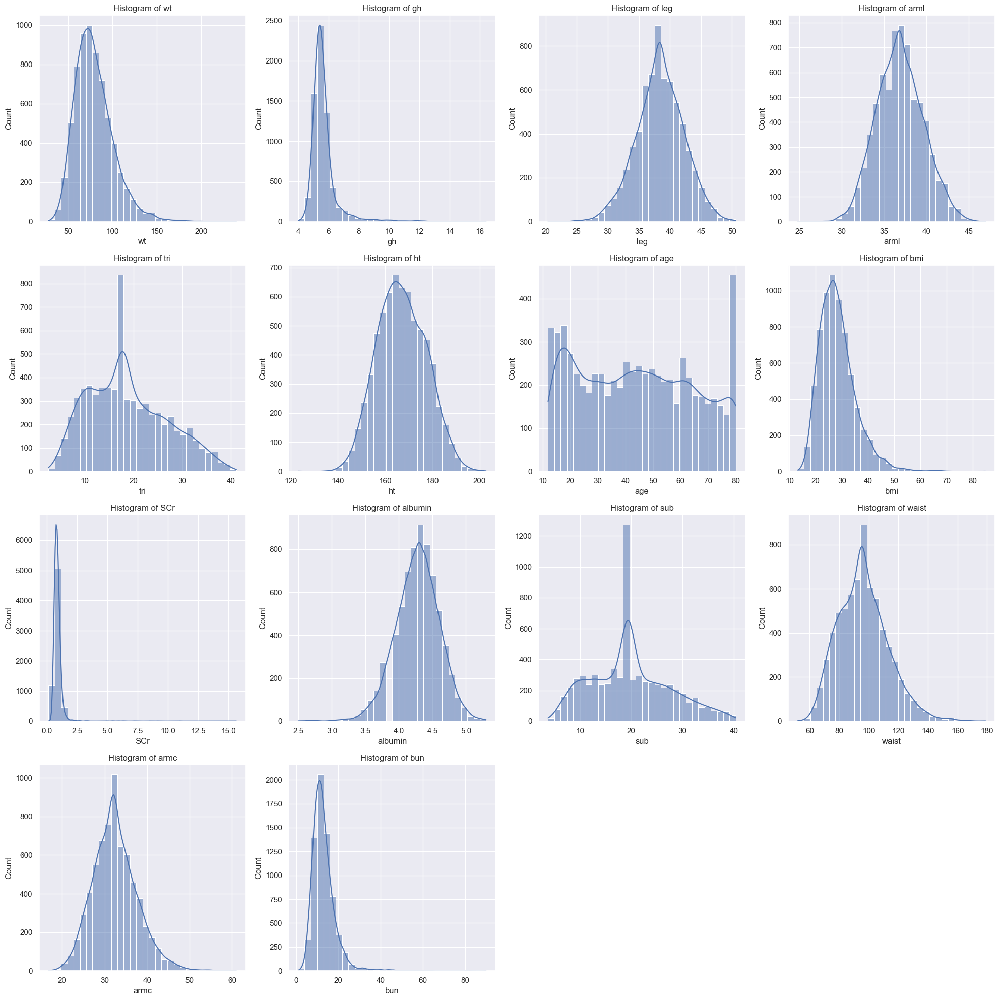

In [69]:
# Reset matplotlib to default settings
%matplotlib inline
plt.rcdefaults()
plt.close("all")
sns.set()

# Number of subplots
num_cols = len(numerical_columns)
num_rows = (num_cols // 4) + (1 if num_cols % 4 != 0 else 0)

# Create subplots
fig, axes = plt.subplots(num_rows, 4, figsize=(20, 5 * num_rows))

# Flatten the axes array for easy iteration
axes = axes.flatten()

# Plot histograms for each numerical variable
for i, col in enumerate(numerical_columns):
    sns.histplot(raw_df[col], bins=30, kde=True, ax=axes[i])
    axes[i].set_title(f'Histogram of {col}')

# Remove any empty subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

### Summary of Findings from Histograms of Numerical Variables

#### 1. **Tri (Triceps Skinfold)**

- **Distribution**: The histogram shows a right-skewed distribution with a notable peak around 20.
- **Observation**: There are a few outliers with very high Triceps Skinfold length.

#### 2. **Wt (Weight)**

- **Distribution**: Weight data appears to be approximately normally distributed but slightly right-skewed.
- **Observation**: Most weights are clustered between 50 to 100 kg, with fewer cases above 100 kg.

#### 3. **Sub (Subscapular Skinfold)**

- **Distribution**: The distribution is right-skewed with a pronounced peak around 20.
- **Observation**: Higher values are less common, indicating fewer individuals with higher subscapular skinfold measurements.

#### 4. **Bmi (Body Mass Index)**

- **Distribution**: Approximately normal distribution with a peak around 25 to 30.
- **Observation**: Most individuals have a BMI in the overweight range, with fewer individuals having very high or very low BMI values.

#### 5. **Leg (Leg Length)**

- **Distribution**: The distribution is roughly normal, with a peak around 40.
- **Observation**: Leg lengths are fairly consistent, with most values clustered around the mean.

#### 6. **SCr (Creatinine)**

- **Distribution**: Highly right-skewed distribution with a large number of low values.
- **Observation**: Indicates that most individuals have low creatinine levels, but there are a few high outliers.

#### 7. **Armc (Arm Circumference)**

- **Distribution**: Roughly normal distribution with a peak around 30.
- **Observation**: Arm circumference values are relatively consistent, with few outliers.

#### 8. **Waist**

- **Distribution**: Approximately normal distribution, peaking around 80-100 cm.
- **Observation**: Indicates a concentration of waist measurements in this range, with some outliers on the higher end.

#### 9. **Age**

- **Distribution**: Fairly uniform distribution with several peaks, indicating diverse age groups.
- **Observation**: A wide age range is represented, with significant numbers of individuals in each age bracket.

#### 10. **Arml (Arm Length)**

- **Distribution**: Approximately normal distribution peaking around 35 to 40.
- **Observation**: Arm length is consistent among individuals, with few extreme values.

#### 11. **Ht (Height)**

- **Distribution**: Roughly normal distribution, peaking around 160 to 170 cm.
- **Observation**: Most individuals are of average height, with fewer very tall or very short individuals.

#### 12. **Albumin**

- **Distribution**: Approximately normal distribution peaking around 4.0 to 4.5.
- **Observation**: Serum albumin levels are consistent, indicating normal liver function among most individuals.

#### 13. **Bun (Blood Urea Nitrogen)**

- **Distribution**: Right-skewed distribution with a peak around 10.
- **Observation**: Most individuals have lower BUN levels, but there are outliers with very high values.

#### 14. **Gh (Glycohemoglobin)**

- **Distribution**: Highly right-skewed distribution, with a peak around 5.0 to 5.5.
- **Observation**: Indicates that most individuals have glycohemoglobin levels within the normal range, with fewer cases of high values suggesting diabetes.

### Overall Observations

- **Right-Skewed Distributions**: Variables like `tri`, `sub`, `SCr`, `bun`, and `gh` show right-skewed distributions, indicating the presence of outliers and a concentration of values at the lower end.
- **Normal Distributions**: Variables such as `wt`, `bmi`, `leg`, `arml`, `ht`, and `albumin` exhibit approximately normal distributions, suggesting consistent measurements within the population.
- **Uniform Age Distribution**: The age variable shows a fairly uniform distribution, representing a wide range of age groups.


**Now, we analyse univariate trends of categorical columns**


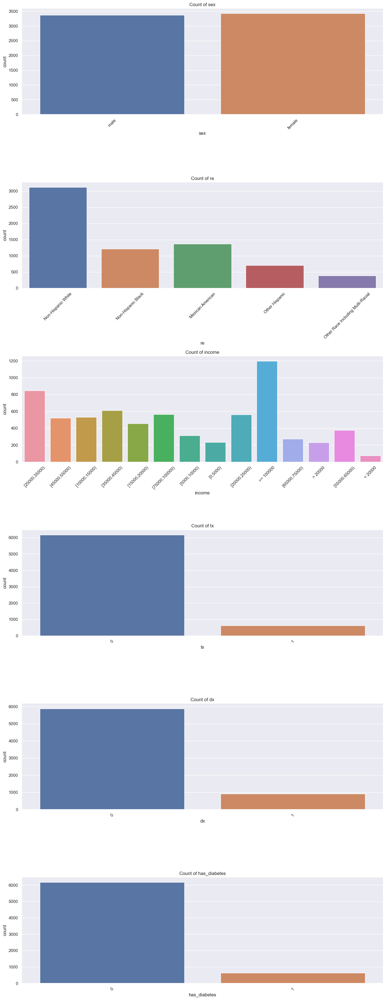

In [70]:
# Number of subplots
num_cols = len(categorical_columns)
num_rows = num_cols

# Create subplots
fig, axes = plt.subplots(num_rows, 1, figsize=(14, 6 * num_rows))

# Plot count plots for each categorical variable
for i, col in enumerate(categorical_columns):
    sns.countplot(data=raw_df, x=col, ax=axes[i])
    axes[i].set_title(f"Count of {col}")
    axes[i].tick_params(axis="x", rotation=45)

plt.tight_layout()
plt.show()

### Summary of Findings from Count Plots of Categorical Variables

#### 1. **Sex**

- **Distribution**: The distribution is almost equal between males and females.
- **Observation**: There is a slightly higher number of males compared to females in the dataset.

#### 2. **Re (Race/Ethnicity)**

- **Distribution**: The largest group is Non-Hispanic White, followed by Non-Hispanic Black and Mexican American. Smaller groups include Other Hispanic and Other Race.
- **Observation**: The dataset includes a diverse range of racial and ethnic groups, with Non-Hispanic Whites being the most represented.

#### 3. **Income**

- **Distribution**: The income distribution shows a higher concentration of individuals in the middle to upper-middle income brackets, with "$100,000 or more" being the top category.
- **Observation**: There is significant variability in income levels, with a notable peak in the highest income category.

#### 4. **Tx (On Insulin or diabetes med)**

- **Distribution**: The vast majority of individuals have not received insulin or diabetes medical treatment (encoded as 0).
- **Observation**: A small minority of individuals have received treatment (encoded as 1), indicating that most participants have not undergone these medications.

#### 5. **Dx (Diagnosis)**

- **Distribution**: Similar to `tx`, the majority of individuals have not received a diagnosis (encoded as 0).
- **Observation**: There are relatively few individuals with a diagnosis (encoded as 1), which might indicate that a large portion of the population is undiagnosed or healthy in the context of the studied condition.

#### 6. **Has_Diabetes**

- **Distribution**: The majority of individuals do not have diabetes (encoded as 0), while a smaller group has diabetes (encoded as 1), based on the set gh criteria >=6.5% of this technical assessment.
- **Observation**: The prevalence of diabetes in the dataset is relatively low, which aligns with typical population studies where only a subset of individuals are expected to have diabetes.

### Overall Observations

- **Balanced Sex Distribution**: The dataset is balanced in terms of gender, providing a good representation of both males and females.
- **Diverse Racial/Ethnic Groups**: There is a diverse representation of racial and ethnic groups, with the majority being non-hispanic whites, which can help in understanding the impact of these factors on health outcomes.
- **Income Variability**: The wide range of income levels suggests that socioeconomic status might play a significant role in the health outcomes being studied.
- **Low Prevalence of Treatment and Diagnosis**: The low numbers in tx (taking meds) and diagnosis (has_diabetes/dx) categories indicate that most individuals might be in early stages of monitoring or not under specific medical care related to diabetes.
- **Low Diabetes Prevalence**: The dataset shows a lower prevalence of diabetes, which can be important for studying risk factors and prevention measures.

#### **Bivariate Analysis**

We move on to bivariate analysis to see the relations of some covariates with our target variable `has_diabetes`


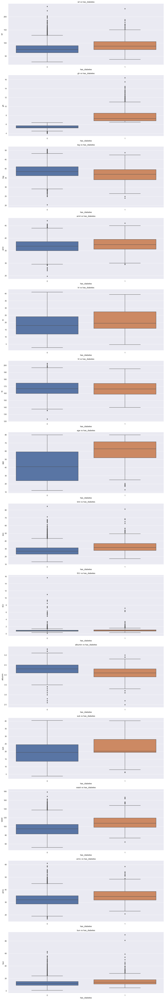

In [71]:
import matplotlib.pyplot as plt
import seaborn as sns

# Number of subplots
num_cols = len(numerical_columns)
num_rows = num_cols

# Create subplots
fig, axes = plt.subplots(num_rows, 1, figsize=(14, 6 * num_rows))

# Plot box plots for each numerical variable against 'has_diabetes'
for i, col in enumerate(numerical_columns):
    sns.boxplot(x="has_diabetes", y=col, data=raw_df, ax=axes[i])
    axes[i].set_title(f"{col} vs has_diabetes")

plt.tight_layout()
plt.show()

**Bi-variate findings part 1**:

- Seems like people with diabetes have higher triceps skinfold
- There is a slight increase in weight and bmi (body mass index) median for individuals with diabetes
- Those with diabetes have lower upper leg length in general
- No difference in distribution of creatinine levels for those with/without diabetes
- A higher waist length observed for those with diabetes
- As for age, evidently older in general for patients with diabetes
- arm circumference and height seems not to have much association with diabetes
- albumnin levels are higher for NON-diabetic patients
- Blood Urea Nitrogen levels abit higher for diabetic patients
- Those with higher gh obviously has diabetes while those w/o has lower levels, as per the set criteria that diabetes means having gh level >= 6.5%


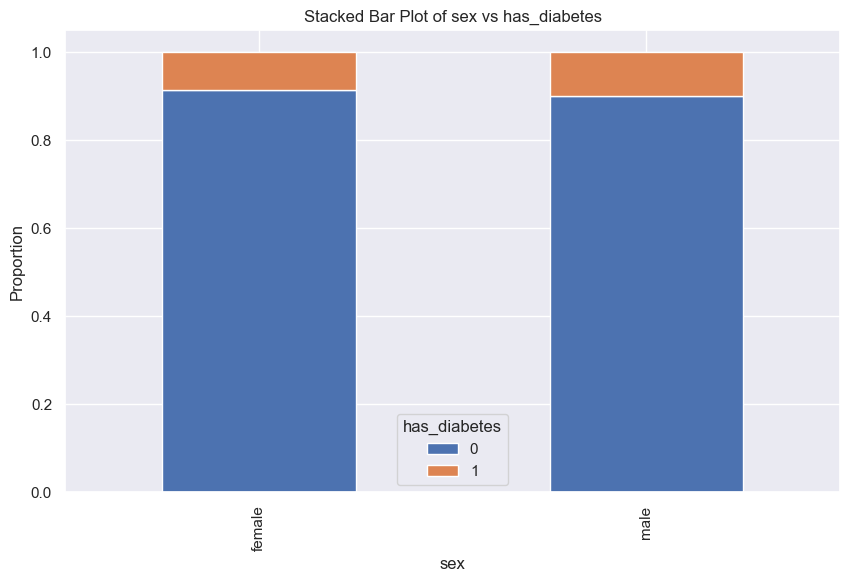

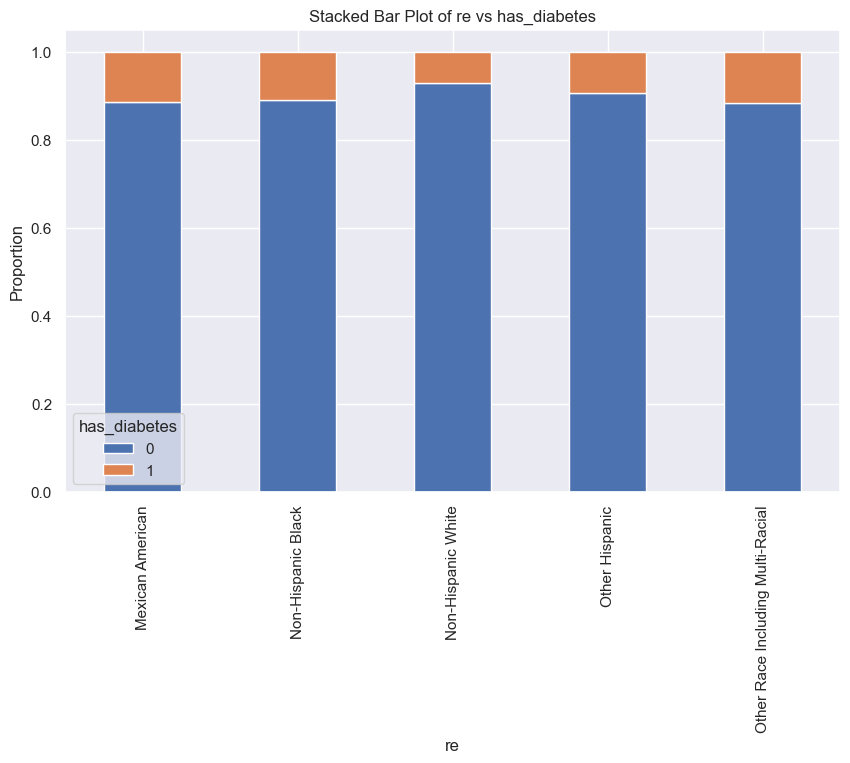

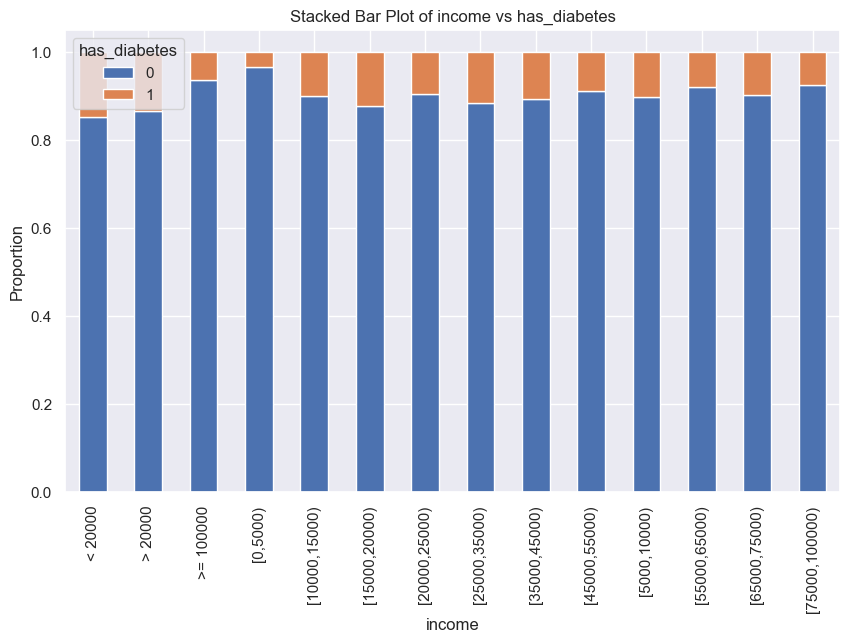

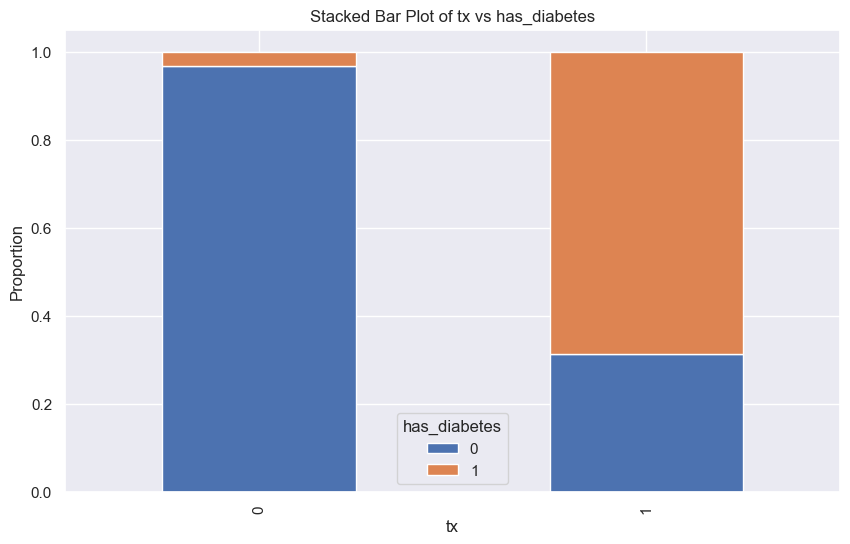

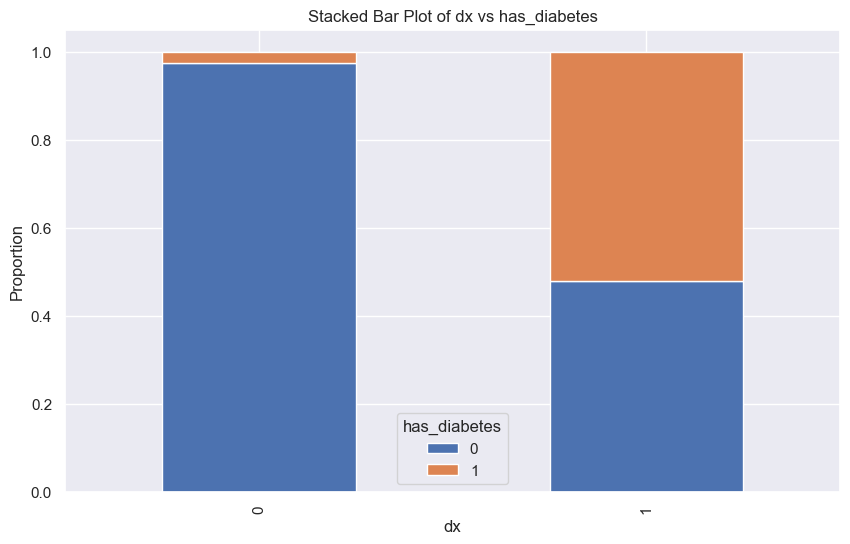

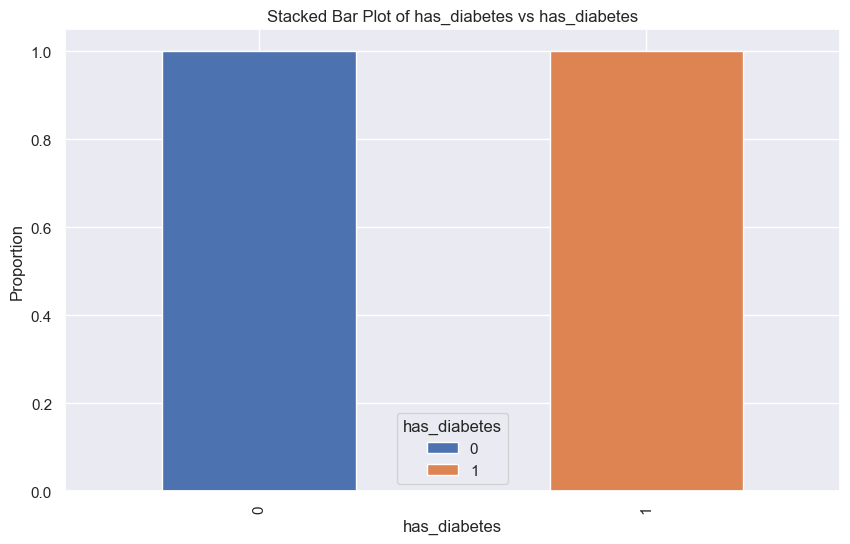

In [72]:
import pandas as pd


# Function to create stacked bar plot
def stacked_bar_plot(raw_df, col, target):
    crosstab = pd.crosstab(raw_df[col], raw_df[target], normalize="index")
    crosstab.plot(kind="bar", stacked=True, figsize=(10, 6))
    plt.title(f"Stacked Bar Plot of {col} vs {target}")
    plt.xlabel(col)
    plt.ylabel("Proportion")
    plt.legend(title=target)
    plt.show()


# Plot stacked bar plots for each categorical variable against 'has_diabetes'
for col in categorical_columns:
    stacked_bar_plot(raw_df, col, "has_diabetes")

**Bi-variate findings part 2**:

- Both female and male categories have a similar proportion of individuals with and without diabetes.

- The proportion of individuals with diabetes is slightly higher in the Non-Hispanic Black and Mexican American groups compared to others. This suggests that while diabetes prevalence is somewhat consistent across different racial/ethnic groups, there may be a slightly higher risk in certain groups.

- Some slight variations observed in income level and those with diabetes, highlighting how socio-economic status may affect the diabetes risk due to lifestyle variations.

- Interestingly, when we look at tx (having insulin/diabetes meds), there is a considerable proportion w/o diabetes diagnosis eating meds, indicating that they may be at a pre-diabetic stage or they have been neglected in the diagnosis

- when we look at dx (diagnosed with diabetes or pre-diabetes) vs has_diabetes, some have yet to be diagnosed with diabetes even though, technically by gh levels, they have diabetes, indicating they may have been neglected in the diagnosis


**Multivariate Analysis**


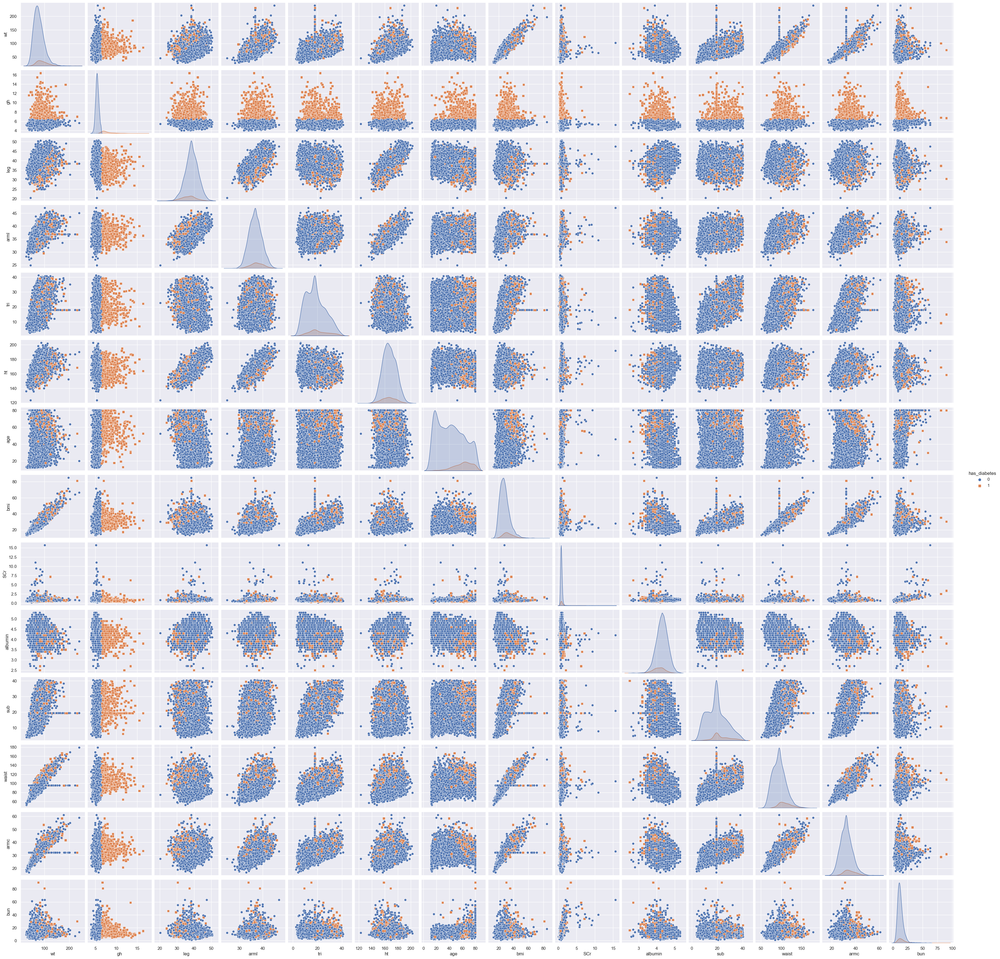

In [41]:
data_subset = raw_df[numerical_columns + ["has_diabetes"]]  # Including target variable

# Creating pair plot colored by 'has_diabetes' status
pair_plot = sns.pairplot(data_subset, hue="has_diabetes", markers=["o", "s"])
plt.show()

**Insights from Multivariate Analysis:**

While multivariate analysis plots are small, the intention of this plot is for us to spot the possible distribution trends among the multiple variables relative to the target variables.

Rough findings:
Strong Interrelationships:

Variables related to body measurements (wt, bmi, waist, armc) are strongly interrelated. This suggests that these variables capture similar underlying factors related to body size and composition, which may have some redundancy and basis to remove.

Indicators of Diabetes:
Glycohemoglobin (gh) shows noticeable clustering of diabetic individuals at higher values, reinforcing its role as a key indicator of diabetes.

Age and glycohemoglobin show trends indicating that older individuals and those with higher body measurements are at higher risk for diabetes.

Multicollinearity Concerns:
The strong correlations between variables such as wt, bmi, and waist suggest potential multicollinearity, which could affect model stability if not addressed.


**Testing relationships between features**


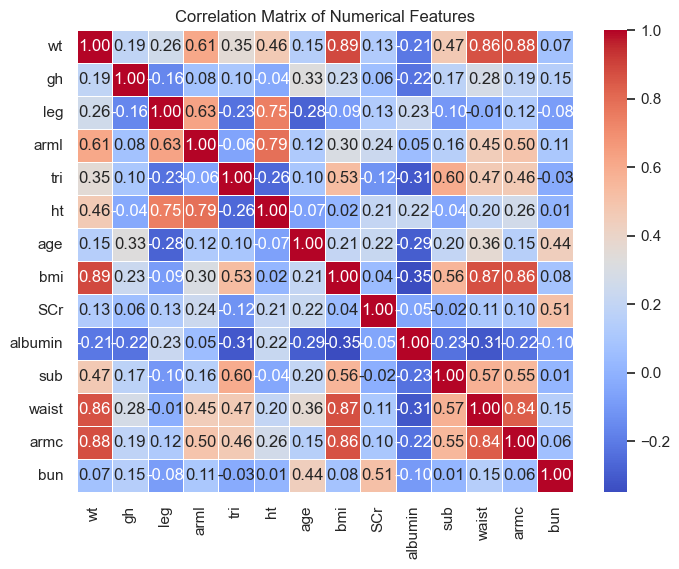

In [73]:
# Calculating correlation matrix for numerical features
correlation_matrix = raw_df[numerical_columns].corr()

# Plotting the correlation matrix
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title("Correlation Matrix of Numerical Features")
plt.show()

In [74]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif_df = raw_df[numerical_columns]

# Calculate VIF for each feature
vif_data = pd.DataFrame()
vif_data["feature"] = numerical_columns
vif_data["VIF"] = [
    variance_inflation_factor(vif_df.values, i) for i in range(len(vif_df.columns))
]

# Sort the data based on VIF score
vif_data_sorted = vif_data.sort_values("VIF", ascending=False)
vif_data_sorted

,feature,VIF
5,ht,1043.380815
3,arml,732.952702
2,leg,299.539085
11,waist,242.971852
12,armc,236.999668
9,albumin,221.737811
7,bmi,197.452410
0,wt,142.546192
1,gh,41.761862
10,sub,14.594352


In [75]:
# Threshold for high correlation
correlation_threshold = 0.8

# Identify pairs of columns where the absolute value of correlation is greater than the threshold
highly_correlated_pairs = [
    (i, j)
    for i in correlation_matrix.columns
    for j in correlation_matrix.columns
    if (i != j) and (abs(correlation_matrix.loc[i, j]) >= correlation_threshold)
]

# Remove duplicate pairs (i.e., (i, j) and (j, i) are considered the same)
unique_highly_correlated_pairs = list(
    set([tuple(sorted(pair)) for pair in highly_correlated_pairs])
)


for unique_pair in unique_highly_correlated_pairs:
    print(unique_pair)

('bmi', 'waist')
('armc', 'wt')
('armc', 'waist')
('waist', 'wt')
('armc', 'bmi')
('bmi', 'wt')


Strong Correlations Among Body Measurements: Height, Weight, BMI, waist circumference, and arm circumference, leg length are all strongly correlated with each other. This indicates that individuals, suggesting that these measures are closely related indicators of body size and composition.


#### **This segment deals with the numerical variables, we will use the `mutual_info_classification` and the `Spearman Correlation` rho value to determine the relationship between the numerical X covariates and the Y binary categorical response variable**


In [76]:
from sklearn.feature_selection import mutual_info_classif
import pandas as pd
from sklearn.preprocessing import StandardScaler

# Assuming raw_df is your feature set and raw_df["has_diabetes"] is your binary target variable
# Compute the Mutual Information Scores for each feature

mi_scores = mutual_info_classif(
    raw_df[numerical_columns],
    raw_df["has_diabetes"],
    discrete_features=False,
)

# Create a DataFrame for easy visualization
mi_scores_df = pd.DataFrame(
    mi_scores,
    index=raw_df[numerical_columns].columns,
    columns=["MI Score"],
)

# Sort the features by MI Score in descending order
mi_scores_df = mi_scores_df.sort_values(by="MI Score", ascending=False).reset_index(
    names="col_name"
)

mi_scores_df

,col_name,MI Score
0,gh,0.308398
1,age,0.039994
2,waist,0.036980
3,sub,0.027103
4,bmi,0.025105
5,albumin,0.018985
6,armc,0.014529
7,wt,0.013659
8,leg,0.012329
9,tri,0.008008


In [77]:
import pandas as pd
import scipy.stats as stats

# Assuming X_train_depression is a DataFrame and y_train_depression is a Series or list
spearman_correlation_ls = []

for column in numerical_columns:
    rho, p_value = stats.spearmanr(raw_df[column], raw_df["has_diabetes"])
    spearman_correlation_ls.append([column, rho, p_value])

# Convert results to DataFrame
spearman_correlation_df = pd.DataFrame(
    spearman_correlation_ls, columns=["Feature", "Rho_Spearman_Correlation", "P-value"]
)

display(spearman_correlation_df)

,Feature,Rho_Spearman_Correlation,P-value
0,wt,0.177388,3.744500e-49
1,gh,0.502805,0.000000e+00
2,leg,-0.130153,4.636961e-27
3,arml,0.075299,5.142120e-10
4,tri,0.102140,3.170972e-17
5,ht,-0.016972,1.618431e-01
6,age,0.260943,3.510335e-106
7,bmi,0.218673,2.331721e-74
8,SCr,0.068862,1.330581e-08
9,albumin,-0.154826,1.007941e-37


In [78]:
mi_scores_df.merge(
    spearman_correlation_df, left_on="col_name", right_on="Feature", how="left"
).drop("Feature", axis=1)

,col_name,MI Score,Rho_Spearman_Correlation,P-value
0,gh,0.308398,0.502805,0.000000e+00
1,age,0.039994,0.260943,3.510335e-106
2,waist,0.036980,0.252261,3.939285e-99
3,sub,0.027103,0.148092,1.265343e-34
4,bmi,0.025105,0.218673,2.331721e-74
5,albumin,0.018985,-0.154826,1.007941e-37
6,armc,0.014529,0.171139,7.979874e-46
7,wt,0.013659,0.177388,3.744500e-49
8,leg,0.012329,-0.130153,4.636961e-27
9,tri,0.008008,0.102140,3.170972e-17


Decision: To remove `ht` (Standing height), `arml`, `tri`, `SCr`, `bun` due to low association of relation with target variable `has_diabetes`. `wt` (weight) to be removed in view of multi-collinearity and redundancy, since technically, `bmi` is calculated from `ht` and `wt`


In [79]:
raw_df.drop(["ht", "arml", "tri", "SCr", "wt", "bun"], axis=1, inplace=True)

In [80]:
raw_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6795 entries, 0 to 6794
Data columns (total 14 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   sex           6795 non-null   object 
 1   age           6795 non-null   float64
 2   re            6795 non-null   object 
 3   income        6795 non-null   object 
 4   tx            6795 non-null   int64  
 5   dx            6795 non-null   int64  
 6   bmi           6795 non-null   float64
 7   leg           6795 non-null   float64
 8   armc          6795 non-null   float64
 9   waist         6795 non-null   float64
 10  sub           6795 non-null   float64
 11  gh            6795 non-null   float64
 12  albumin       6795 non-null   float64
 13  has_diabetes  6795 non-null   int64  
dtypes: float64(8), int64(3), object(3)
memory usage: 743.3+ KB


### **FEATURE ENGINEERING + Collinearity Check between the X covariates from the training data**


**Perform one_hot_encoding first**


In [81]:
ohe_columns = ["sex", "re"]
raw_df = pd.get_dummies(raw_df, columns=ohe_columns, drop_first=True)

In [82]:
# Define the mapping dictionary for income brackets to ordinal values
income_mapping = {
    "[0,5000)": 0,
    "[5000,10000)": 1,
    "[10000,15000)": 2,
    "[15000,20000)": 3,
    "[20000,25000)": 4,
    "[25000,35000)": 5,
    "[35000,45000)": 6,
    "[45000,55000)": 7,
    "[55000,65000)": 8,
    "[65000,75000)": 9,
    "[75000,100000)": 10,
    "> 20000": 4,
    "< 20000": 3,
    ">= 100000": 10,
}

# Apply the mapping to the income column
raw_df["income"] = raw_df["income"].map(income_mapping)

# Verify the changes
print(raw_df.head())

         age  income  tx  dx    bmi   leg  armc  waist   sub   gh  albumin  \
0  34.166667       5   0   0  32.22  41.5  36.4  100.4  24.9  5.2      4.8   
1  16.833333       7   0   0  22.00  42.0  26.6   74.7  10.5  5.7      4.6   
2  60.166667       2   1   1  42.39  35.3  42.2  118.2  35.6  6.0      3.9   
3  26.083333       5   0   0  32.61  41.7  37.0  103.7  23.2  5.1      4.2   
4  49.666667       6   0   0  30.57  37.5  33.3  107.8  28.0  5.3      4.3   

   has_diabetes  sex_male  re_Non-Hispanic Black  re_Non-Hispanic White  \
0             0         1                      0                      1   
1             0         1                      1                      0   
2             0         0                      1                      0   
3             0         1                      0                      0   
4             0         0                      0                      1   

   re_Other Hispanic  re_Other Race Including Multi-Racial  
0                  

In [83]:
binary_columns = [
    "re_Non-Hispanic Black",
    "re_Non-Hispanic White",
    "re_Other Hispanic",
    "re_Other Race Including Multi-Racial",
    "sex_male",
    "tx",
    "dx",
]

binary_df = raw_df[binary_columns]
binary_df

,re_Non-Hispanic Black,re_Non-Hispanic White,re_Other Hispanic,re_Other Race Including Multi-Racial,sex_male,tx,dx
0,0,1,0,0,1,0,0
1,1,0,0,0,1,0,0
2,1,0,0,0,0,1,1
3,0,0,0,0,1,0,0
4,0,1,0,0,0,0,0
...,...,...,...,...,...,...,...
6790,0,0,0,0,1,0,0
6791,0,1,0,0,0,0,1
6792,0,0,1,0,1,0,0
6793,1,0,0,0,1,0,0


In [84]:
# Calculate the phi coefficient matrix
phi_coefficient_matrix = np.zeros((len(binary_df.columns), len(binary_df.columns)))

for i in range(len(binary_df.columns)):
    for j in range(len(binary_df.columns)):
        phi_coefficient_matrix[i, j] = np.corrcoef(
            binary_df.iloc[:, i], binary_df.iloc[:, j]
        )[0, 1]

phi_coefficient_matrix = pd.DataFrame(
    phi_coefficient_matrix, index=binary_df.columns, columns=binary_df.columns
)

# Mask the upper triangle of the phi coefficient matrix
mask = np.triu(np.ones_like(phi_coefficient_matrix, dtype=bool))
phi_coefficient_matrix_masked = phi_coefficient_matrix.mask(mask)


# Plot the heatmap using Plotly
fig = px.imshow(
    phi_coefficient_matrix_masked,
    labels=dict(x="Feature 1", y="Feature 2", color="Phi Coefficient"),
    x=binary_df.columns,
    y=binary_df.columns,
    color_continuous_scale="RdBu_r",
    template="simple_white",
)

fig.update_layout(
    title="Phi Coefficient Heatmap",
    width=500,
    height=500,
)
fig.show()

Only `tx` and `dx` have strong collinearity


In [85]:
import pandas as pd
import scipy.stats as stats

updated_categorical_columns = binary_columns + ["income"]
cramers_v_df = raw_df[updated_categorical_columns]


def cramers_v(x, y):
    confusion_matrix = pd.crosstab(x, y)
    chi2 = stats.chi2_contingency(confusion_matrix)[0]
    n = confusion_matrix.sum().sum()
    phi2 = chi2 / n
    r, k = confusion_matrix.shape
    phi2corr = max(0, phi2 - ((k - 1) * (r - 1)) / (n - 1))
    rcorr = r - ((r - 1) ** 2) / (n - 1)
    kcorr = k - ((k - 1) ** 2) / (n - 1)
    return np.sqrt(phi2corr / min((kcorr - 1), (rcorr - 1)))


# Assuming cramers_v_df is your DataFrame
cramers_results = []
for column1 in cramers_v_df.columns:
    for column2 in cramers_v_df.columns:
        if column1 != column2:
            cramers_results.append(
                [
                    column1,
                    column2,
                    cramers_v(
                        cramers_v_df[column1],
                        cramers_v_df[column2],
                    ),
                ]
            )

# Convert results to DataFrame
cramers_df = pd.DataFrame(cramers_results, columns=["Feature1", "Feature2", "CramersV"])

# Identify feature pairs with high collinearity
high_corr_pairs = cramers_df[cramers_df["CramersV"] > 0.75]
print(high_corr_pairs)

# Feature selection: remove one variable from each pair of highly correlated variables
features_to_remove = set()
for i in range(high_corr_pairs.shape[0]):
    features_to_remove.add(high_corr_pairs.iloc[i, 1])

   Feature1 Feature2  CramersV
40       tx       dx  0.780442
47       dx       tx  0.780442


#### **Here, we perform chi-squared test on categorical X covariates vs. the Y binary TARGET categorical response variable `has_diabetes`**

There are two types of Pearson’s chi-square tests:

1. The chi-square goodness of fit test is used to test whether the frequency distribution of a categorical variable is different from your expectations.
2. **The chi-square test of independence is used to test whether two categorical variables are related to each other. [We are doing this]**

**References:**

1. Chi-Square (Χ²) Tests | Types, Formula & Examples - Scribbr. https://www.scribbr.com/statistics/chi-square-tests/.
2. Hypothesis Testing - Chi Squared Test - Boston University School of .... https://sphweb.bumc.bu.edu/otlt/mph-modules/bs/bs704_hypothesistesting-chisquare/bs704_hypothesistesting-chisquare_print.html.
3. Chi-squared test | Definition, Formula, Types, & Facts. https://www.britannica.com/topic/chi-squared-test.
4. Chi-Square Goodness of Fit Test | Formula, Guide & Examples - Scribbr. https://www.scribbr.com/statistics/chi-square-goodness-of-fit/.
5. What is a Chi-Square Test? Formula, Examples & Uses - Simplilearn. https://www.simplilearn.com/tutorials/statistics-tutorial/chi-square-test.
6. en.wikipedia.org. https://en.wikipedia.org/wiki/Chi-squared_test.


In [86]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2

In [87]:
# Apply SelectKBest class to extract top k best features
bestfeatures = SelectKBest(
    score_func=chi2, k="all"
)  # Set k='all' to select all features
fit = bestfeatures.fit(
    cramers_v_df,
    raw_df["has_diabetes"],
)


# Get the scores
dfpvalues = pd.DataFrame(fit.pvalues_)
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(cramers_v_df.columns)

# Concatenate two dataframes for better visualization
featureScores = pd.concat([dfcolumns, dfscores, dfpvalues], axis=1)
featureScores.columns = ["Feature", "Score", "p-value"]  # Naming the dataframe columns

# Print the best features
print(
    featureScores.nlargest(len(featureScores), "Score")
)  # Change len(featureScores) to the number of features you want

                                Feature        Score   p-value
5                                    tx  2620.215607  0.000000
6                                    dx  1999.508396  0.000000
7                                income    16.048445  0.000062
1                 re_Non-Hispanic White    15.217243  0.000096
0                 re_Non-Hispanic Black     4.969776  0.025794
3  re_Other Race Including Multi-Racial     2.509152  0.113187
4                              sex_male     2.273235  0.131625
2                     re_Other Hispanic     0.051765  0.820020


Decision: While there's strong collinearity between `tx` and `dx`, both do still give relevant information which are crucial to the diagnosis of diabetes. for example knowing that someone who is diagnosed with PRE-diabetes, taking medications may be pivotal to the model's decision making.

Here we also realised that `income` also plays a significant relationship towards the outcome of `has_diabetes`.


In [88]:
raw_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6795 entries, 0 to 6794
Data columns (total 17 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   age                                   6795 non-null   float64
 1   income                                6795 non-null   int64  
 2   tx                                    6795 non-null   int64  
 3   dx                                    6795 non-null   int64  
 4   bmi                                   6795 non-null   float64
 5   leg                                   6795 non-null   float64
 6   armc                                  6795 non-null   float64
 7   waist                                 6795 non-null   float64
 8   sub                                   6795 non-null   float64
 9   gh                                    6795 non-null   float64
 10  albumin                               6795 non-null   float64
 11  has_diabetes     

Before exporting our cleaned dataframe, we need to remove `gh` since it has already been feature engineered into the supervised label `has_diabetes`.


In [89]:
raw_df.drop(["gh"], axis=1, inplace=True)

In [90]:
"gh" in raw_df.columns

False

**Lastly, we save export our cleaned dataframe to SQLite database**


In [91]:
from sqlalchemy import create_engine

# Create a SQLAlchemy engine
engine = create_engine("sqlite:///cleaned_data.db")

# Export the DataFrame to an SQLite table named 'cleaned_data'
raw_df.to_sql("cleaned_data", con=engine, if_exists="replace", index=False)

print("DataFrame successfully exported to SQLite database.")

DataFrame successfully exported to SQLite database.


**This concludes our EDA (With Data Preprocessing) Phase, move on to Part 2 for Modelling**

---
